# CAM and Object Detection

## Authors: 
Sat Arora, sat.arora@uwaterloo.ca \
Richard Fan, r43fan@uwaterloo.ca


## Abstract

Class Activation Maps (CAMs) is a very important tool and concept in Computer Vision. During classification, the goal of CAMs is to indicate the regions of the image that were used by a Convolutional Neural Network to lead it to classifying an image as containing a certain object.

In order to understand what the Class Activation Maps do, this report will describe in detail the motivation, ideas & concepts that guide our process to making our own CAMs. Following this, we will do some deeper analysis of what happens in certain scenarios to better understand the algorithm's output.

The approach and motivation are inspired by [Learning Deep Features for Discriminative Localization](http://cnnlocalization.csail.mit.edu/Zhou_Learning_Deep_Features_CVPR_2016_paper.pdf) (Zhou, Khosla, Laperdriza, Oliva, Tarralba), a paper that was released in 2016. The appraoch is extended by comparing common classification CNNs (specifically, ResNet18) with a CNN that we train, analyzing the difference in image labelling and the heat map. These networks will be trained on a face/no-face dataset with labelling. 

## Team Contributions

Sat Arora: sat.arora@uwaterloo.ca
- Initial ResNet18 model for object detection.
- Experimenting with multiple objects of same type.
- Testing models with more than one face and corresponding analysis.
- Motivation and Conclusion sections.

Richard Fan: r43fan@uwaterloo.ca
- Creating custom model (and fine-tuning) for object detection.
- Constructing a pipeline for heatmap generation, given models and images.
- Implemented training and testing pipelines for arbitrary models.
- Fine-tuned pre-trained ResNet-18 model and trained another model from scratch for locating classes of interest.

Fun fact: We are born on the same day.

## Motivation

### Conceptual Idea

As mentioned in the Abstract, the goal of CAMs is to indicate the regions of images that is used by the CNN to identify a certain category.

In the case of categorization, the last layer before output is a softmax layer (in order to determine which class is the most likely). Before running this last layer, if we run a technique called **Global Average Pooling (GAP)** on the convolutional feature maps at this point, then we can use these as features for a fully-connected layer that produces our categorization.

Note: The idea of GAP is straight forward. An implementation can be seen here:
$$\text{GAP}(F_d) = \frac{1}{H \times W} \sum_{i=1}^{H} \sum_{j=1}^{W} F_d(i, j)$$
Simply put, it averages the values of the maps into a singular number, and by doing so it reduces the dimensionality of the image.

With this structure, we can leverage our knowledge of how the softmax works: we can project the weights of the output layer onto the convolution feature maps. This essentially leaves us with a heatmap of the "most important" features (since higher weights in the classification will be where the object is). This technique is known as "Class Activation Mapping".

### How can this be more formally seen?
Say that $\forall (x,y)$, the activation of unit $k$ in the last convolutional layer in the CNN is $f_k(x,y)$. Then, after performing GAP, we have the average for unit $k$ to be $$F^k = \sum_{x,y}{f_k(x,y)}$$

Thus, we have that for some arbitrary class $c$, the input to the softmax in the final decision layer is $$S_c = \sum_k{w_k^cF_k}$$ where $w_k^c$ is exactly the "importance", or weight, of class $c$ for the unit $k$. Recall that the otuput of softmax is thus $$\frac{\exp(S_c)}{\sum_{c_0}{\exp(S_{c_0})}}$$ for class $c$. If we plug in $F^k = \sum_{x,y}{f_k(x,y)}$, we get $$S_c = \sum_{x,y}{\sum_k{w_k^cf_k(x,y)}}$$

Define $M_c$ to be the CAM for $c$, with each spatial element $M_c(x,y) = \sum_k{w_k^cf_k(x,y)}$. Then we can rewrite the definition of the class score $S_c$ to be $$S_c = \sum_{x,y}{M_c(x,y)}$$

As such, we see that $M_c(x,y)$ is exactly the importance of the activation for $c$ at spatial coordinate $(x,y)$. 

### What does this mean?

Thus, we can conclude that $f_k$ will be the map of the persence of the visual pattern corresponding to the location of the object. We have that the CAM is a weighted linear sum of these visual patterns, and so by upsamimagepling the CAM to the size of the input image, we can identify the image regions that played the biggest influence in the particular category. 

*Or, by a simple rethought, the regions that are highlighted correspond to the class that the CNN describes this image to be.*

## Code Libraries

Many libraries used in our implementation would be considered as "standard" in Computer Vision projects or courses, but we list out everything in the import order to get a better understanding of what each import is used for:

- ``PIL``: Used to read images from a directory. This image will get passed into the tensor layers. 

- ``torch`` / ``torchvision``: The main libraries for PyTorch (along with its own packages). These provide pre-set models (like ResNet18), and ability to create transformations and our own CNNs. This is extensively used for manipulating our tensors (along with ``numpy``, which is more forward-facing as will be seen), providing loaders for our training and testing process, and to perform training & computations on CUDA/MPS (GPU configurations) or the CPU.

- ``numpy``: Used to manipulate tensors from ``torch``, and acts as a middle layer to write data in a form that libarries such as ``cv2`` and ``PIL`` can understand. 

- ``cv2``: Used for dealing with image resizing, writing/drawing, and modifying. It is particularly useful in overlaying our heatmap on top of the image, and optionally writing an image to a directory for later use.

- ``matplotlib``: Used specifically for the ``plt`` command, which plots an image. This is used to show the results of our model.

- ``warnings``: Library that deals with output for warnings. We use this to simply ignore warnings that are not relevant and clutter the notebook, in order to present the data more cleanly.

- ``random``: Implementing label noise requires randomly selecting indexes to flip the labels.

In [1]:
from PIL import Image

import torch
import torchvision.models as models
from torchvision import transforms
import torch.nn as nn
import torchvision.transforms as transforms
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader
from torch.autograd import Variable
from torch.nn import functional as F

import numpy as np
import cv2
import matplotlib.pyplot as plt
import warnings
import random
warnings.filterwarnings('ignore')

## Device Configuration

We prefer to use a GPU, either with cuda (supported by NVIDIA) or mps (supported by Apple Silicon) rather than the CPU. By default, we use the CPU if we can't find it, but training models is typically done much faster on the GPU due to higher memory bandwidth, parallel processing, optimizaitions in libraries like PyTorch that take advantage of the GPU, and possibly the existencne of some dedicate hardware designed for machine learning tasks on the GPU.

In [2]:
# USE GPU IF AVAILABLE
device = torch.device('cpu')
if torch.cuda.is_available():
    device = torch.device('cuda')
elif torch.backends.mps.is_available():
    device = torch.device('mps')

## Dataset
We use a dataset of face and non-face images found on Kaggle from Sagar Karar. To get this dataset and format it in the way that the program needs to read it, run the following commands.

**Note**: The first step assumes that you have the ``kaggle`` package installed on pip. Otherwise, click on [this link to the dataset page](https://www.kaggle.com/datasets/sagarkarar/nonface-and-face-dataset) and download the dataset. This will replace the first line in the bash script below.

After downloading the data and manipulating its contents to restructure it, we have that the train and test datasets are in the ``Dataset/train`` and ``Dataset/folder`` respectively. Note that the data is transformed by reshaping it, converting it to a Tensor, and then normalizing it with the standardized `mean` and `std` from ImageNet, which is what the models are trained on.

In [3]:
# Define transformations for data preprocessing
transform = transforms.Compose([
    transforms.Resize((224, 224)),  # Resize images to a uniform size
    transforms.ToTensor(),  # Convert images to PyTorch tensors
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Normalize the images
])

# Load train and test datasets
train_dataset = ImageFolder('Dataset/train', transform=transform)
test_dataset = ImageFolder('Dataset/test', transform=transform)

# Create data loaders
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

## Training

The training process involves the model (which we start with a pre-trained ResNet, then an untrained one later), the optimizer (we use the Adam Optimizer, which is common in PyTorch), our additional criterion for loss (which we will use cross-entropy), and then the train and test loaders, followed by the number of epochs (number of iterations we train and improve our model by).

In [4]:
# Training loop

def train(model, optimizer, criterion, train_loader, test_loader, num_epochs=10):
    train_correct = 0
    train_total = 0
    for epoch in range(num_epochs):
        model.train()
        train_loss = 0.0
        for images, labels in train_loader:
            images, labels = images.to(device), labels.to(device)
            
            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            train_total += labels.size(0)
            train_correct += (torch.argmax(outputs, dim=1) == labels).sum().item()

            train_loss += loss.item() * images.size(0)

        epoch_loss = train_loss / len(train_dataset)
        print(f'Epoch [{epoch + 1}/{num_epochs}], Train Loss: {epoch_loss:.4f}, Train Accuracy: {train_correct / train_total * 100:.2f}%')

    # Evaluation on test set
    model.eval()
    test_correct = 0
    test_total = 0
    test_loss_total = 0.0
    with torch.no_grad():
        for images, labels in test_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            _, predicted = torch.max(outputs, 1)
            test_total += labels.size(0)
            test_correct += (predicted == labels).sum().item()
            test_loss_total += loss.item() * images.size(0)


    accuracy = test_correct / test_total
    test_loss = test_loss_total / len(test_dataset)
    print(f'Test Loss: {test_loss:.4f}, Test Accuracy: {accuracy * 100:.2f}%')

    return model

## Testing

In [5]:
def test(model, img):
    model.eval()

    if img is not None:
        print("Image loaded successfully!")
    else:
        print("Unable to load the image. Please check the file path.")

    features_blobs = []
    def hook_feature(module, input, output):
        features_blobs.append(output.data.cpu().numpy())

    model._modules.get('layer4').register_forward_hook(hook_feature)

    preprocess = transforms.Compose([
        transforms.ToPILImage(),
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ])
    input_img = preprocess(img).unsqueeze(0).to(device)


    output = None
    with torch.no_grad():
        output = model(input_img)

    predictions = F.softmax(output, dim=1).data.squeeze()
    print(f"Model predicts the image has a face with probability {predictions[0].item() * 100}%")

    params = list(model.parameters())
    weight = np.squeeze(params[-2].data.cpu().numpy())
    cam = weight[0].dot(features_blobs[0].reshape(-1, 7 * 7))

    cam = cam.reshape(7, 7)
    cam = cam - np.min(cam)
    cam = cam / np.max(cam)
    cam = np.uint8(255 * cam)
    cam = cv2.resize(cam, (img.shape[1], img.shape[0])) 

    # Apply heatmap on the original image
    heatmap = cv2.applyColorMap(255 - cam, cv2.COLORMAP_JET)

    return heatmap


## Test 1. ResNet-18 with the pre-trained weights

Image loaded successfully!
Model predicts the image has a face with probability 99.99980926513672%


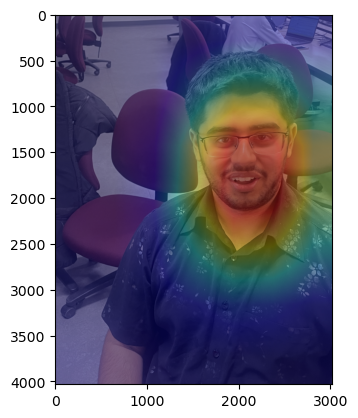

Image loaded successfully!
Model predicts the image has a face with probability 99.99988079071045%


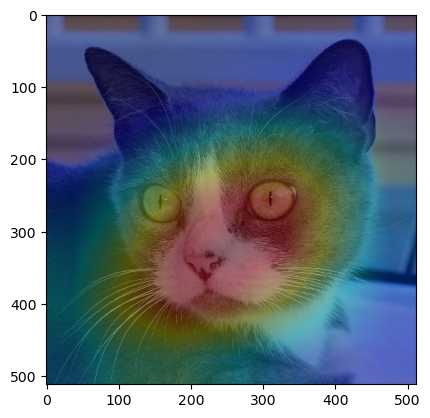

Image loaded successfully!
Model predicts the image has a face with probability 99.99980926513672%


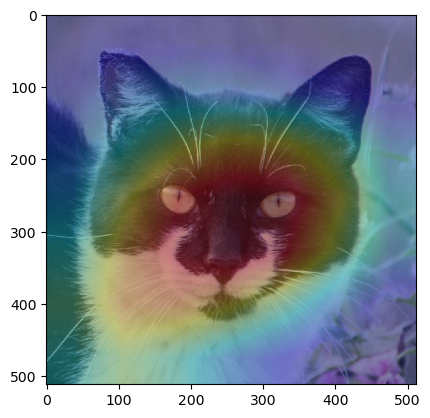

Image loaded successfully!
Model predicts the image has a face with probability 100.0%


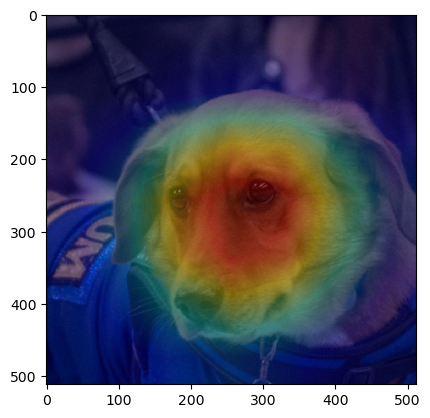

Image loaded successfully!
Model predicts the image has a face with probability 100.0%


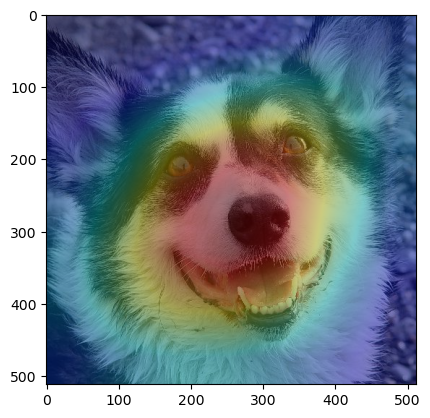

Image loaded successfully!
Model predicts the image has a face with probability 100.0%


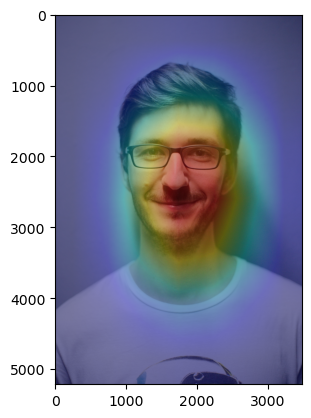

Image loaded successfully!
Model predicts the image has a face with probability 99.99996423721313%


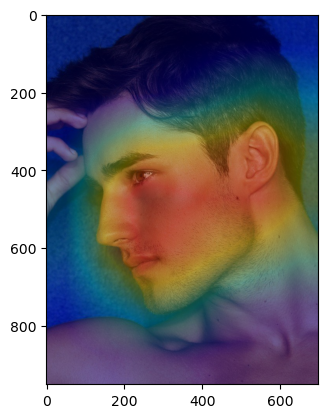

In [6]:
# Generate heatmap
faces_list = ['Examples/sat.png', 
              'Dataset/test/face/Cat5.png',
              'Dataset/test/face/Cat113.png',
              'Dataset/test/face/Dog10.png',
              'Dataset/test/face/Dog200.png',
              'Dataset/test/face/Human368.png',
              'Dataset/test/face/Human1001.png']
model_1 = torch.load('models/model_1_2023-12-20_17:15:35.pth') # this is the trained_model in the above cell.
for image_file in faces_list:
    original_img = cv2.imread(image_file)
    img = cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB)
    heatmap = test(model_1, img)
    output_img = heatmap * 0.3 + img.astype('float32') * 0.5
    plt.imshow(output_img.astype('uint8'))
    plt.show()


The heatmap for the ResNet-18 model with pre-trained weights almost flawlessly indicates the regions that a face is present. The predictions for all of these tests are all nearly 100% confident that it is a face, which leads us to believe that this model is nearly flawless.

We seek to see how well it does on images that there is no face.

Image loaded successfully!
Model predicts the image has a face with probability 0.00148696863107034%


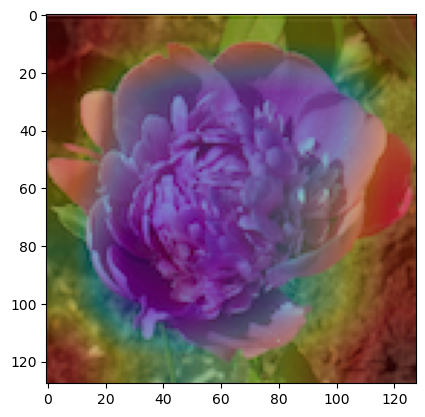

Image loaded successfully!
Model predicts the image has a face with probability 0.0001974331325982348%


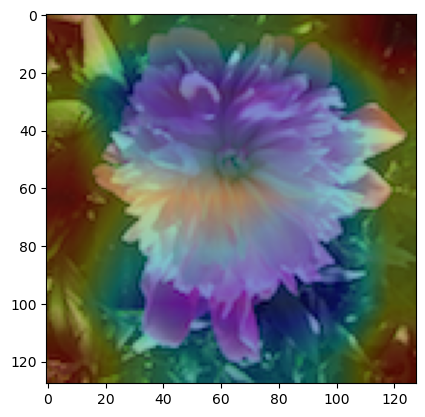

Image loaded successfully!
Model predicts the image has a face with probability 0.14343507355079055%


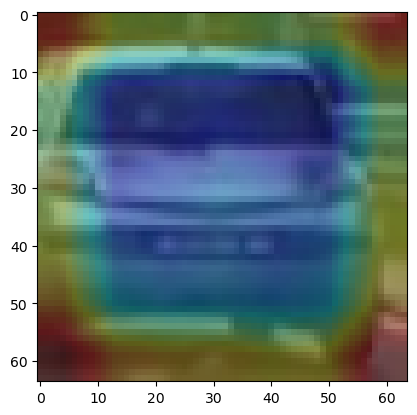

Image loaded successfully!
Model predicts the image has a face with probability 0.18885054159909487%


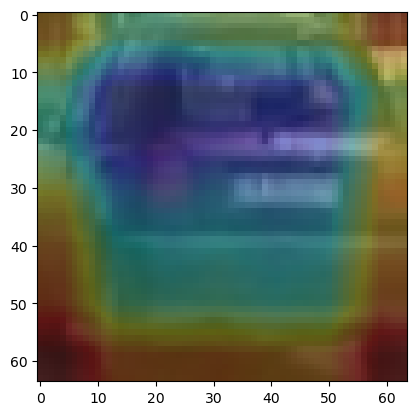

Image loaded successfully!
Model predicts the image has a face with probability 1.5303478576242924%


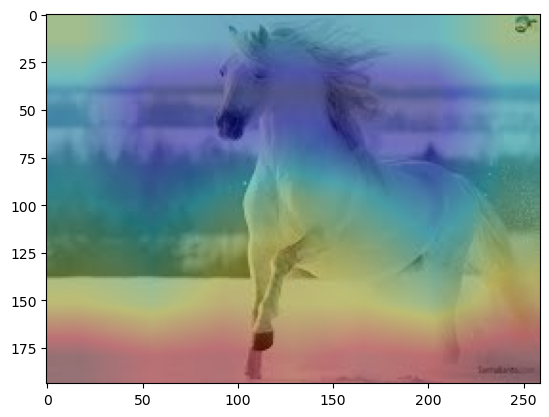

Image loaded successfully!
Model predicts the image has a face with probability 0.27568459045141935%


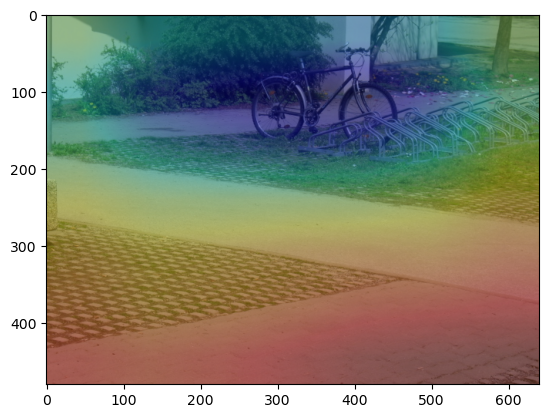

In [7]:
no_faces_list = ['Dataset/test/no_face/0060.png',
                 'Dataset/test/no_face/0120.png',
                 'Dataset/test/no_face/Car90.png',
                 'Dataset/test/no_face/Car177.png',
                 'Dataset/test/no_face/horse-134.jpg',
                 'Dataset/test/no_face/bike_110.bmp']

for image_file in no_faces_list:
    original_img = cv2.imread(image_file)
    img = cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB)
    heatmap = test(model_1, img)
    output_img = heatmap * 0.3 + img.astype('float32') * 0.5
    plt.imshow(output_img.astype('uint8'))
    plt.show()

In the no-face examples, the colouring is darker around the objects in focus (e.g., flower, horse, etc.), which signifies that the classifier has low weights around the object itself and higher weights in the area surrounding it. In constrast, the face images run pretty well, despite the types being outside of human, cat, and dog.

## Test 2. ResNet-18 without the pre-trained weights

Image loaded successfully!
Model predicts the image has a face with probability 95.56778073310852%


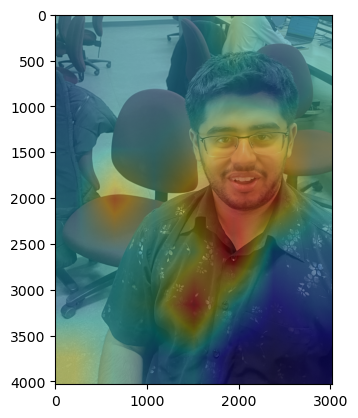

Image loaded successfully!
Model predicts the image has a face with probability 99.99991655349731%


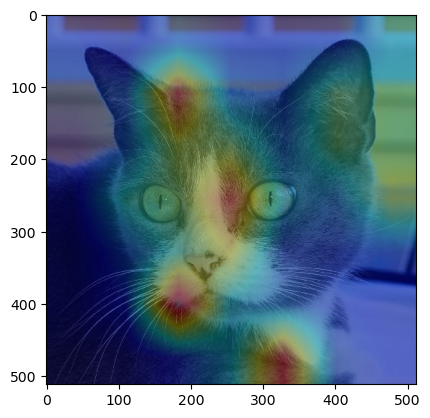

Image loaded successfully!
Model predicts the image has a face with probability 99.99997615814209%


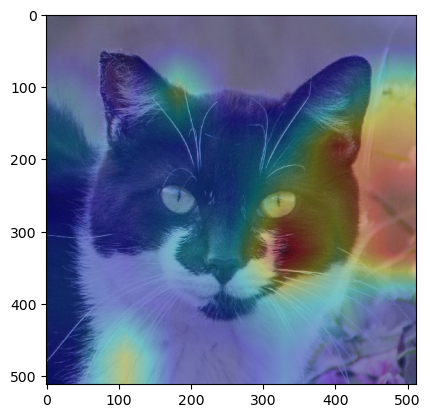

Image loaded successfully!
Model predicts the image has a face with probability 99.9769389629364%


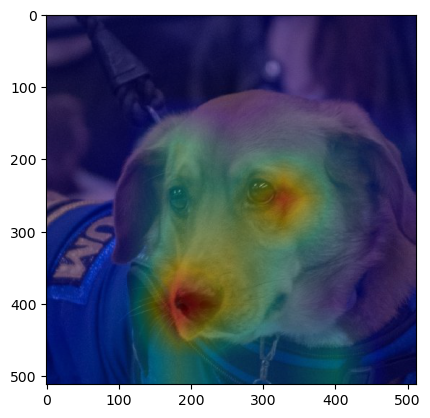

Image loaded successfully!
Model predicts the image has a face with probability 100.0%


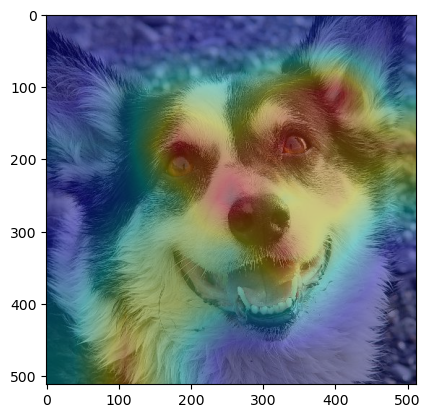

Image loaded successfully!
Model predicts the image has a face with probability 99.9940276145935%


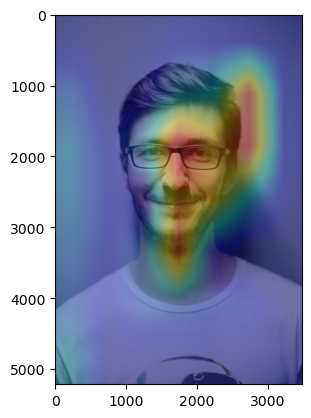

Image loaded successfully!
Model predicts the image has a face with probability 99.99455213546753%


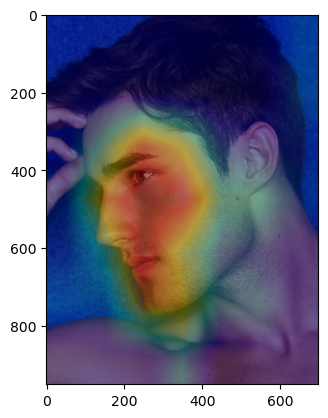

In [8]:
# Generate heatmap
faces_list = ['Examples/sat.png','Dataset/test/face/Cat5.png','Dataset/test/face/Cat113.png','Dataset/test/face/Dog10.png','Dataset/test/face/Dog200.png', 'Dataset/test/face/Human368.png', 'Dataset/test/face/Human1001.png']
model_2 = torch.load('models/model_2_2023-12-20_16:58:27.pth')
for image_file in faces_list:
    original_img = cv2.imread(image_file)
    img = cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB)
    heatmap = test(model_2, img)
    output_img = heatmap * 0.3 + img.astype('float32') * 0.5
    plt.imshow(output_img.astype('uint8'))
    plt.show()

We see that ResNet-18 without pre-trained weights performs well in predicting that there is no face. However, the heatmaps do a very poor job of extracting the regions where a face lies. We see below the implementation with some tests with no face:

Image loaded successfully!
Model predicts the image has a face with probability 0.006092565308790654%


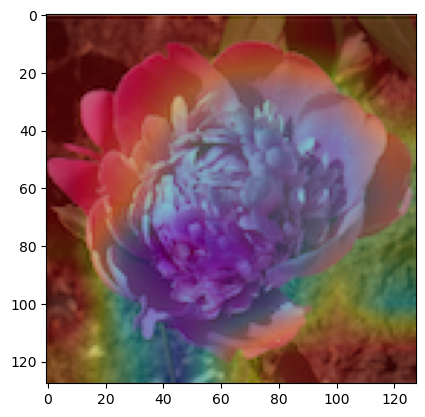

Image loaded successfully!
Model predicts the image has a face with probability 0.08248843951150775%


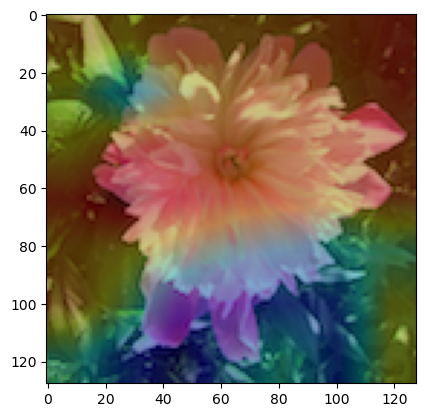

Image loaded successfully!
Model predicts the image has a face with probability 0.01236992102349177%


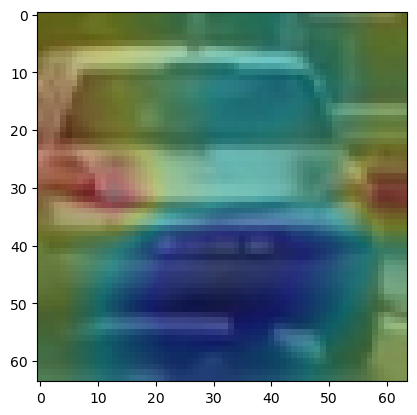

Image loaded successfully!
Model predicts the image has a face with probability 0.005975819658488035%


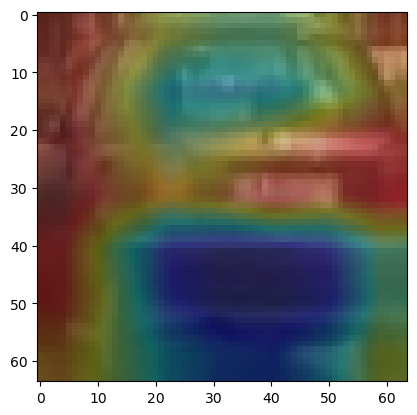

Image loaded successfully!
Model predicts the image has a face with probability 99.00293946266174%


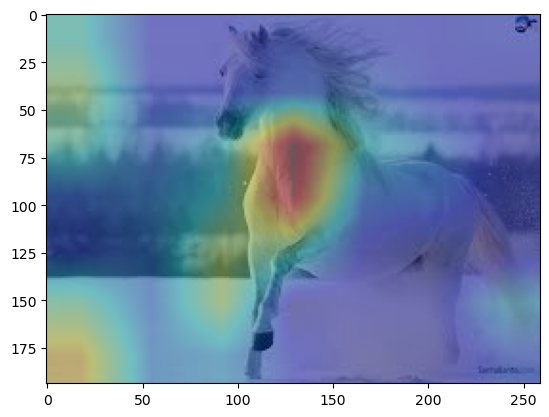

Image loaded successfully!
Model predicts the image has a face with probability 0.0032717143767513335%


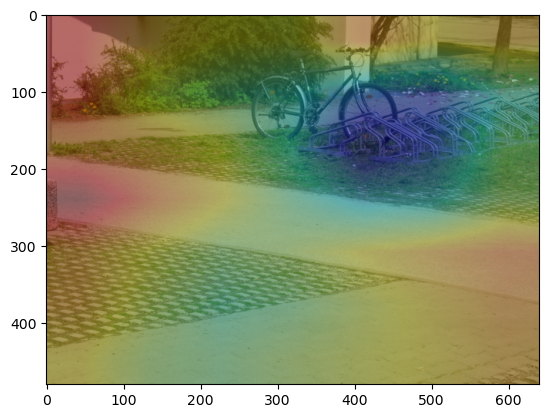

In [9]:
no_faces_list = ['Dataset/test/no_face/0060.png',
                 'Dataset/test/no_face/0120.png',
                 'Dataset/test/no_face/Car90.png',
                 'Dataset/test/no_face/Car177.png',
                 'Dataset/test/no_face/horse-134.jpg',
                 'Dataset/test/no_face/bike_110.bmp']

for image_file in no_faces_list:
    original_img = cv2.imread(image_file)
    img = cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB)
    heatmap = test(model_2, img)
    output_img = heatmap * 0.3 + img.astype('float32') * 0.5
    plt.imshow(output_img.astype('uint8'))
    plt.show()

We see that the ResNet-18 model without pre-trained weights requires a much larger number of epochs (20 vs 2), and even then it is quite inaccurate at determining if faces exists. However, in the case of no faces, we see a similar pattern where the model still accurately is more certain that there is no face (since the probability that there is a face is substantially close to 0% for these examples).

## Adding Label Noise

Now, we experiment with what happens to the results if we add label noise. To do this, we simply scramble the ``train_dataset`` by scrambing 50 face classifications as no-face, and vice-versa.

In [10]:
train_dataset = ImageFolder('Dataset/train', transform=transform)
test_dataset = ImageFolder('Dataset/test', transform=transform)

# Function to swap labels for misclassification
def misclassify(dataset):
    face_indices = [i for i in range(len(dataset)) if dataset[i][1] == 1]  # Assuming class 1 is for faces
    no_face_indices = [i for i in range(len(dataset)) if dataset[i][1] == 0]  # Assuming class 0 is for non-faces
    print("Separation complete")
    # Misclassify 50 face images as non-faces
    face_sampled_indices = random.sample(face_indices, 50)
    for idx in face_sampled_indices:
        dataset.targets[idx] = 0  # Change the label to non-face
    # Misclassify 50 non-face images as faces
    no_face_sampled_indices = random.sample(no_face_indices, 50)
    for idx in no_face_sampled_indices:
        dataset.targets[idx] = 1  # Change the label to face

    return dataset

# Apply misclassification to train and test datasets
train_dataset = misclassify(train_dataset)

# Create data loaders
updated_train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)

Separation complete


Image loaded successfully!
Model predicts the image has a face with probability 99.99487400054932%


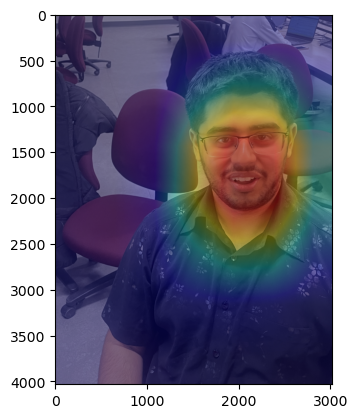

Image loaded successfully!
Model predicts the image has a face with probability 99.99957084655762%


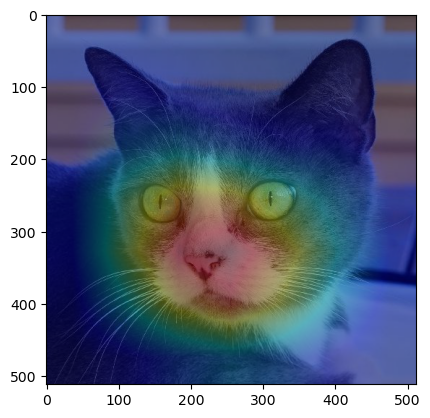

Image loaded successfully!
Model predicts the image has a face with probability 99.1275429725647%


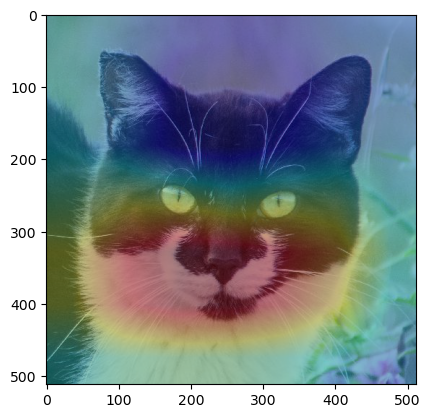

Image loaded successfully!
Model predicts the image has a face with probability 99.99769926071167%


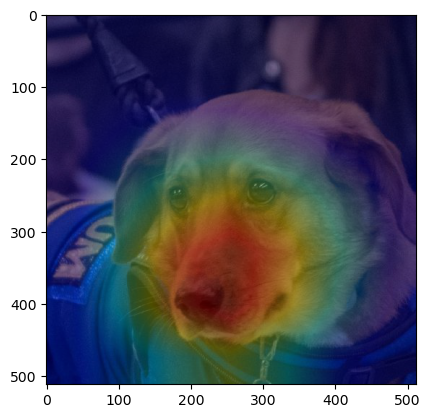

Image loaded successfully!
Model predicts the image has a face with probability 99.99997615814209%


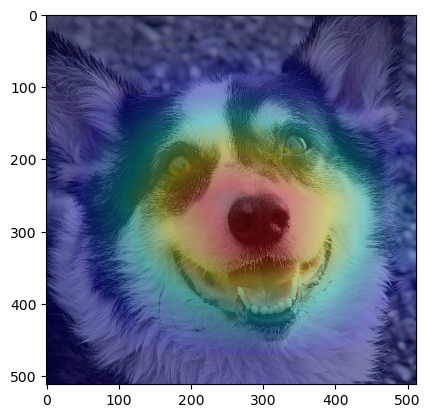

Image loaded successfully!
Model predicts the image has a face with probability 99.99998807907104%


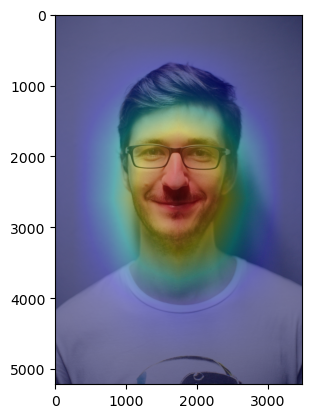

Image loaded successfully!
Model predicts the image has a face with probability 99.99927282333374%


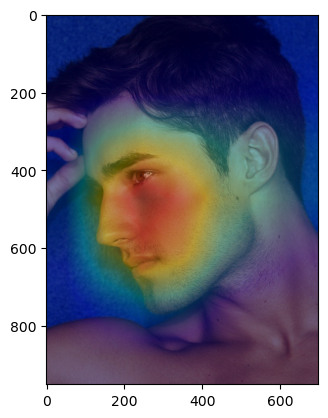

In [11]:
# Generate heatmap
faces_list = ['Examples/sat.png', 
              'Dataset/test/face/Cat5.png',
              'Dataset/test/face/Cat113.png',
              'Dataset/test/face/Dog10.png',
              'Dataset/test/face/Dog200.png',
              'Dataset/test/face/Human368.png',
              'Dataset/test/face/Human1001.png']

model_3 = torch.load('models/model_3_2023-12-20_17:43:02.pth') # this is the trained_model in the above cell.

for image_file in faces_list:
    original_img = cv2.imread(image_file)
    img = cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB)
    heatmap = test(model_3, img)
    output_img = heatmap * 0.3 + img.astype('float32') * 0.5
    plt.imshow(output_img.astype('uint8'))
    plt.show()

Image loaded successfully!
Model predicts the image has a face with probability 0.00013420079767456627%


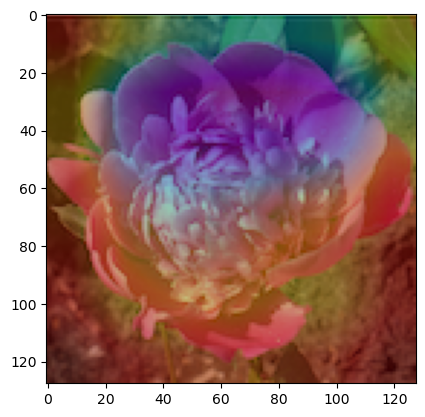

Image loaded successfully!
Model predicts the image has a face with probability 0.0006594274054805283%


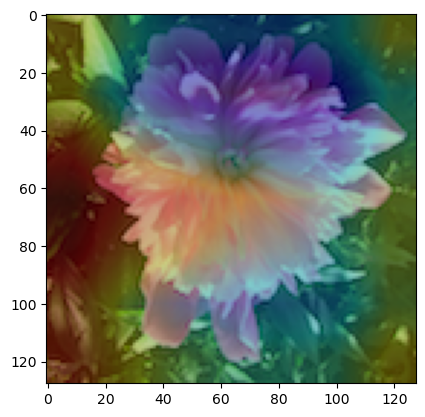

Image loaded successfully!
Model predicts the image has a face with probability 9.856479437075905e-05%


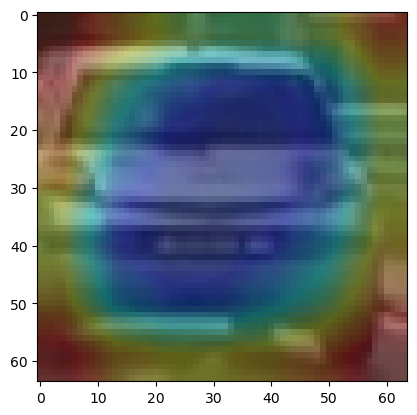

Image loaded successfully!
Model predicts the image has a face with probability 0.000771807026467286%


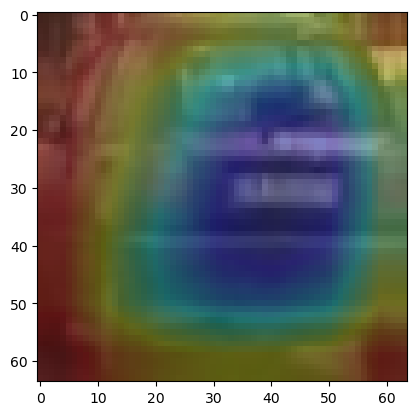

Image loaded successfully!
Model predicts the image has a face with probability 1.1590033769607544%


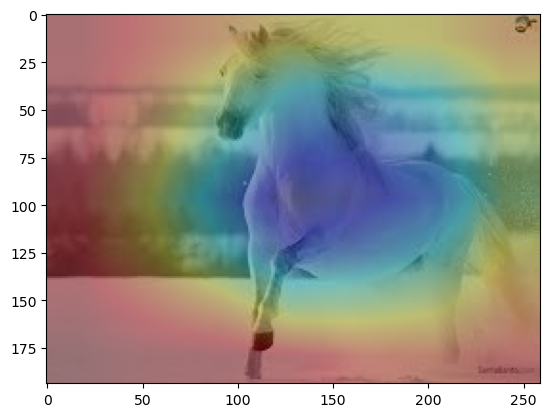

Image loaded successfully!
Model predicts the image has a face with probability 0.16534593887627125%


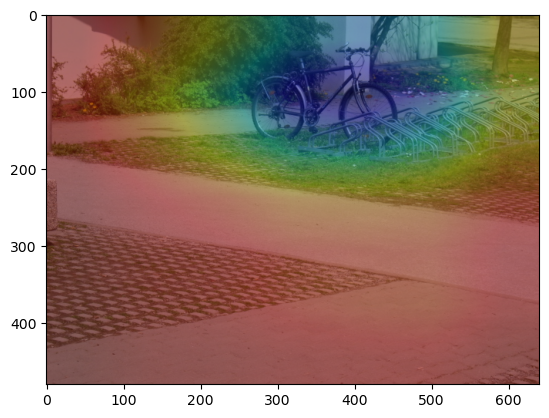

In [12]:
no_faces_list = ['Dataset/test/no_face/0060.png',
                 'Dataset/test/no_face/0120.png',
                 'Dataset/test/no_face/Car90.png',
                 'Dataset/test/no_face/Car177.png',
                 'Dataset/test/no_face/horse-134.jpg',
                 'Dataset/test/no_face/bike_110.bmp']

for image_file in no_faces_list:
    original_img = cv2.imread(image_file)
    img = cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB)
    heatmap = test(model_3, img)
    output_img = heatmap * 0.3 + img.astype('float32') * 0.5
    plt.imshow(output_img.astype('uint8'))
    plt.show()

In this case, the label noise made no noticable difference to the heatmaps and predictive performance.

Image loaded successfully!
Model predicts the image has a face with probability 99.91718530654907%


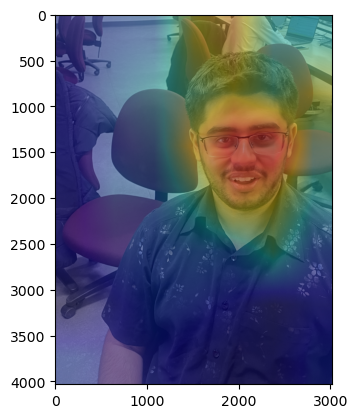

Image loaded successfully!
Model predicts the image has a face with probability 96.63455486297607%


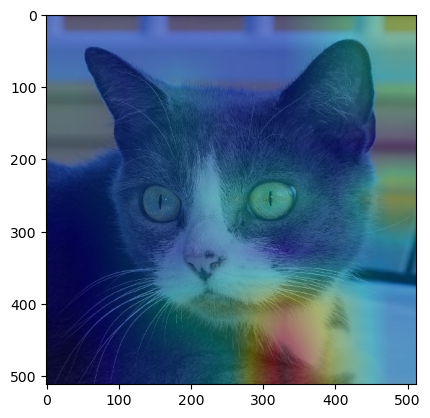

Image loaded successfully!
Model predicts the image has a face with probability 92.11913347244263%


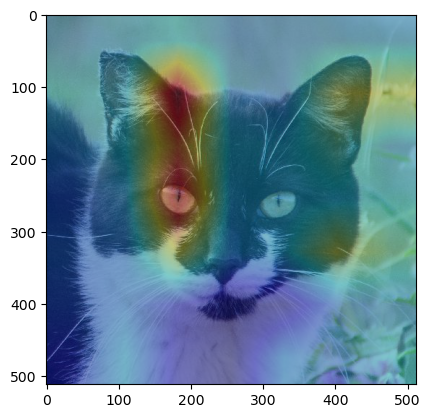

Image loaded successfully!
Model predicts the image has a face with probability 99.6309220790863%


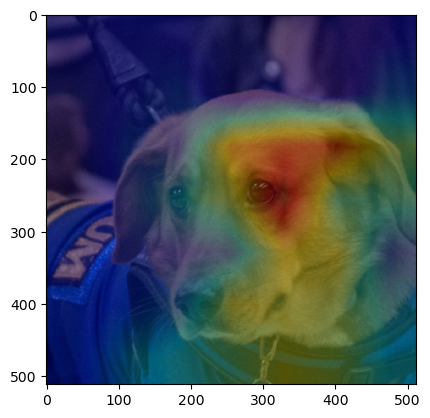

Image loaded successfully!
Model predicts the image has a face with probability 99.99864101409912%


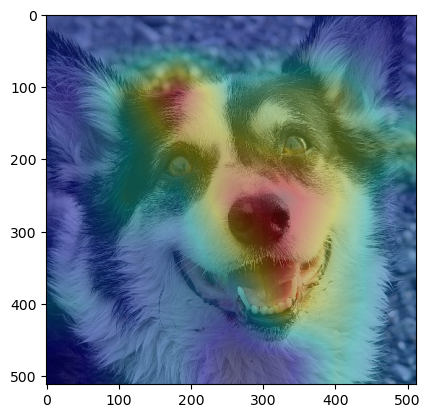

Image loaded successfully!
Model predicts the image has a face with probability 100.0%


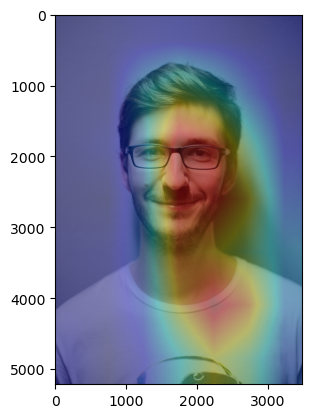

Image loaded successfully!
Model predicts the image has a face with probability 99.99381303787231%


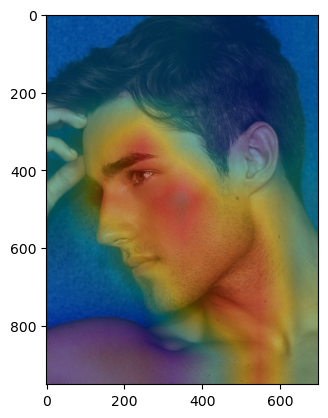

In [13]:
# Generate heatmap
faces_list = ['Examples/sat.png','Dataset/test/face/Cat5.png','Dataset/test/face/Cat113.png','Dataset/test/face/Dog10.png','Dataset/test/face/Dog200.png', 'Dataset/test/face/Human368.png', 'Dataset/test/face/Human1001.png']
model_4 = torch.load('models/model_4_2023-12-20_17:52:31.pth')
for image_file in faces_list:
    original_img = cv2.imread(image_file)
    img = cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB)
    heatmap = test(model_4, img)
    output_img = heatmap * 0.3 + img.astype('float32') * 0.5
    plt.imshow(output_img.astype('uint8'))
    plt.show()

Image loaded successfully!
Model predicts the image has a face with probability 1.7790006268114666e-05%


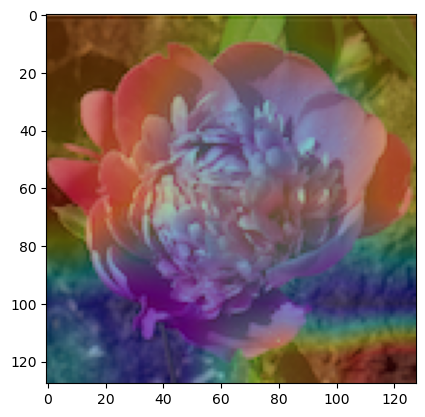

Image loaded successfully!
Model predicts the image has a face with probability 0.004612849079421721%


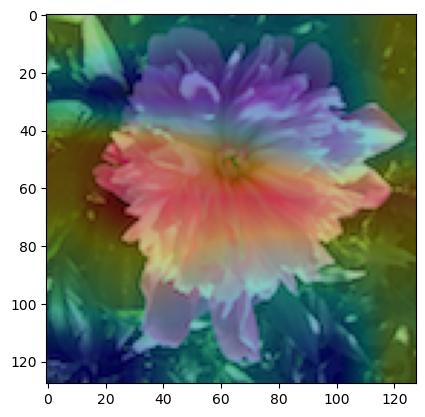

Image loaded successfully!
Model predicts the image has a face with probability 0.06379166734404862%


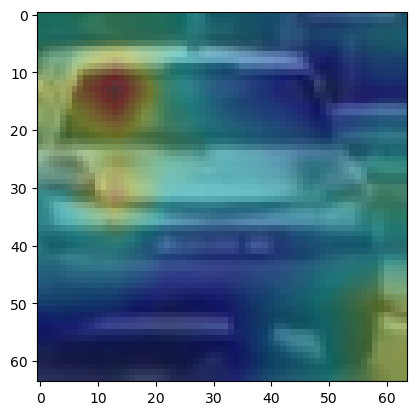

Image loaded successfully!
Model predicts the image has a face with probability 0.017300285981036723%


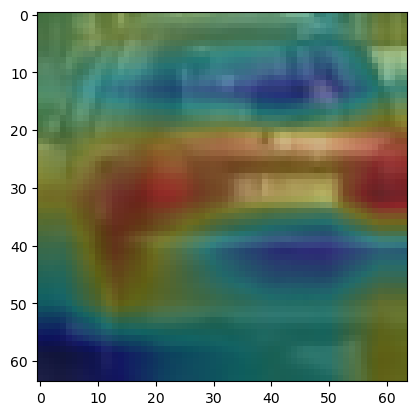

Image loaded successfully!
Model predicts the image has a face with probability 0.2740690018981695%


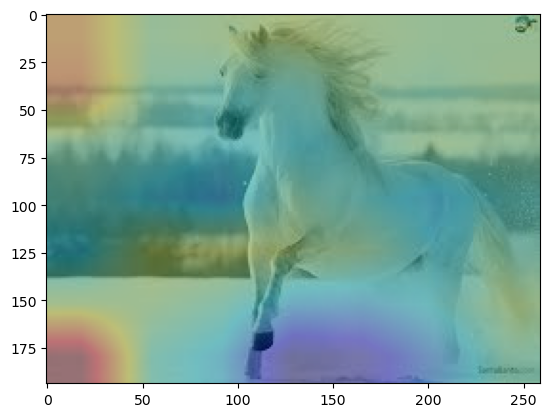

Image loaded successfully!
Model predicts the image has a face with probability 9.850239166553365e-05%


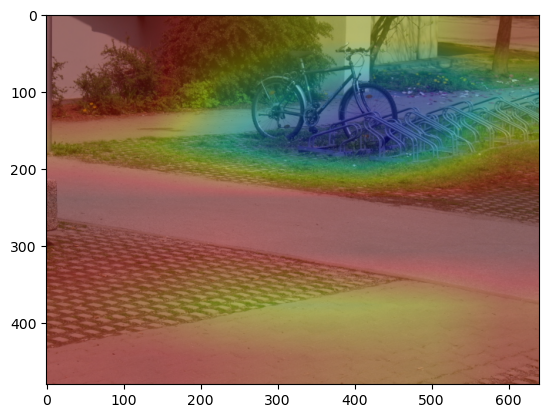

In [14]:
no_faces_list = ['Dataset/test/no_face/0060.png',
                 'Dataset/test/no_face/0120.png',
                 'Dataset/test/no_face/Car90.png',
                 'Dataset/test/no_face/Car177.png',
                 'Dataset/test/no_face/horse-134.jpg',
                 'Dataset/test/no_face/bike_110.bmp']

for image_file in no_faces_list:
    original_img = cv2.imread(image_file)
    img = cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB)
    heatmap = test(model_4, img)
    output_img = heatmap * 0.3 + img.astype('float32') * 0.5
    plt.imshow(output_img.astype('uint8'))
    plt.show()

The same conclusion applies for when we used our trained model without any pre-trained weights: the heatmaps make no noticable difference.

## Investigating further: What happens if there are multiple faces?

We have seen a pretty accurate set of results in classifying whether an image has a face or not when there are either 0 or 1 faces. Let's see what happens if we extend to two faces:

Image loaded successfully!
Model predicts the image has a face with probability 99.99352693557739%


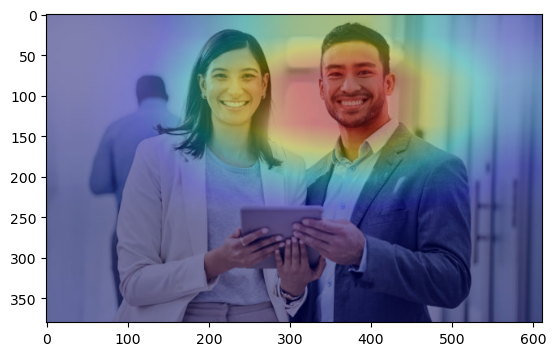

Image loaded successfully!
Model predicts the image has a face with probability 99.99738931655884%


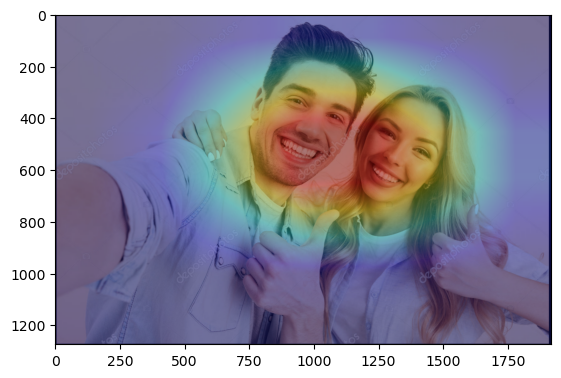

Image loaded successfully!
Model predicts the image has a face with probability 99.05536770820618%


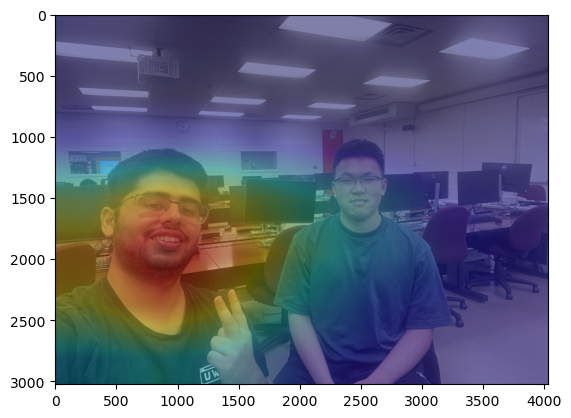

Image loaded successfully!
Model predicts the image has a face with probability 20.833203196525574%


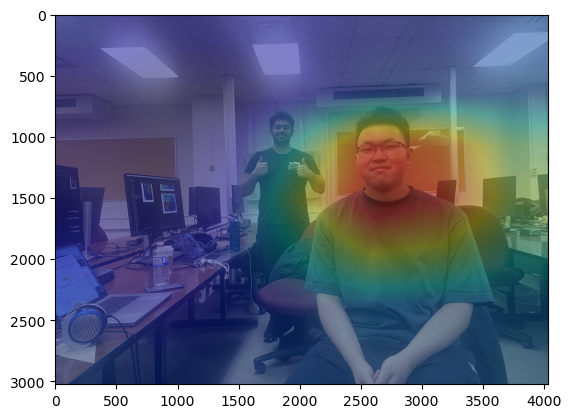

In [15]:
faces_list = ['Examples/2 faces-1.jpeg',
              'Examples/2 faces-2.png',
              'Examples/2 faces-3.png',
              'Examples/2 faces-4.png']
for image_file in faces_list:
    original_img = cv2.imread(image_file)
    img = cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB)
    heatmap = test(model_1, img) # Using the same model as the first one that was trained
    output_img = heatmap * 0.3 + img.astype('float32') * 0.5
    plt.imshow(output_img.astype('uint8'))
    plt.show()

The above is the case of the pre-trained weighted ResNet-18 model. In the case of the pre-trained model, the outputs tends to have a heat map drawn over the face that is the most dominant. In the case that the faces are roughly the same distance away, it indicates a region including both images. This makes sense, as in order to classify the image as containing a face, there must be a spatial region that is "dominant" in the weights that results in a face. The features of a face are much more dominant when the face is larger, leading to it being possible that hte heat map only has hot regions near the more dominant one, in comparison to the rest of the image.

Below, we see an implementation of the untrained one:

Image loaded successfully!
Model predicts the image has a face with probability 97.56320118904114%


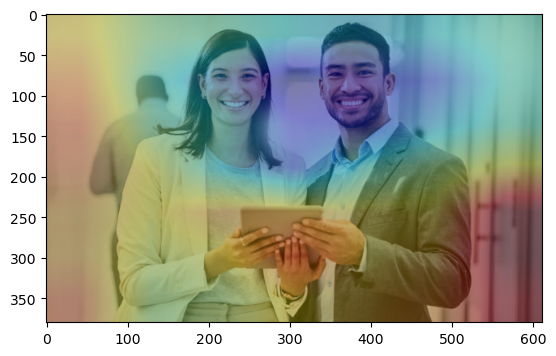

Image loaded successfully!
Model predicts the image has a face with probability 99.99350309371948%


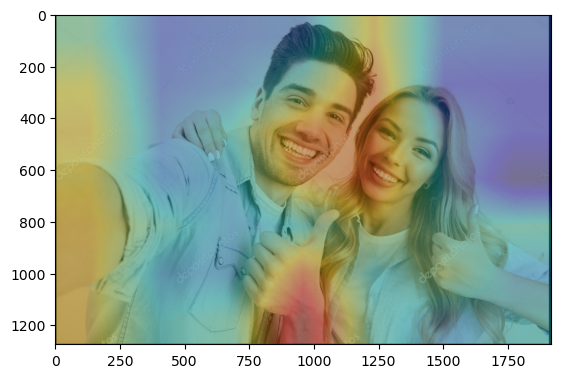

Image loaded successfully!
Model predicts the image has a face with probability 93.33000183105469%


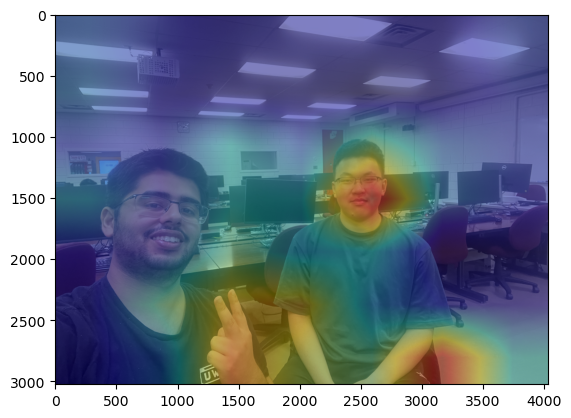

Image loaded successfully!
Model predicts the image has a face with probability 94.7810709476471%


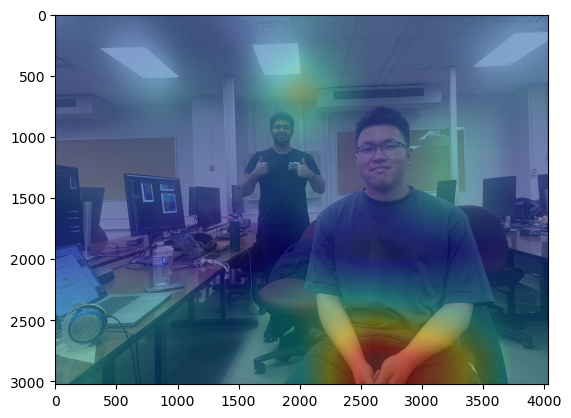

In [16]:
faces_list = ['Examples/2 faces-1.jpeg', 'Examples/2 faces-2.png', 'Examples/2 faces-3.png', 'Examples/2 faces-4.png']
model_2 = torch.load('models/model_2_2023-12-20_16:58:27.pth')
for image_file in faces_list:
    original_img = cv2.imread(image_file)
    img = cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB)
    heatmap = test(model_2, img) # Using the same model as the first one that was trained
    output_img = heatmap * 0.3 + img.astype('float32') * 0.5
    plt.imshow(output_img.astype('uint8'))
    plt.show()

Like in the case of 0 or 1 faces, the ResNet-18 model without pretrained weights is more inaccurate. However, this is much more exaggerated in finding the face in this one. Only one of the test images (the third one) is realistically close to the heat map of the corresponding heat map on the pre-trained one (and otherwise, it usually misses the face completely). Interestingly though, it is still accurate in concluding that the image contains a face, which upon further investigation, we may better understand why this model, even though it is correct in being so sure a face exists, tends to have really poor attempts of a heat map when multiple faces are present.

## Summary of Observations

- ResNet-18 with pre-trained weights performs the best in terms of both model predictions heatmap highlighting. 
- The randomly initialized ResNet-18 model does descently well on the predictions for face/no-face but does poorly on the heatmap presentation. 
- When a face is not present, the heatmap places a greater emphasis on the background over the objects.
- When label flipping is only done on a small subset of training data (~4% in the example above), the effect on model predictions and heatmap repsentation is minimal for both pre-trained model and randomly initailized model.
- When the model is ran on images with multiple faces, the pre-trained model often predicts label correctly and the heatmap would locate the face in the front. When the two faces are close together, the heatmap usually highlight the area in between them. For the model trained from scratch, the label prediction works well for two faces images, but the heatmap struggles to identify the region of interest even more than that of images with a single face.


## Further Improvements

- More experiments can be done on situations where more than 2 faces appear on the image.
- For test images, human annotation can be done on the images to give the exact boundary of faces so that we could quantify the performances of the models.
- More types of pre-trained model can be used to compare performance of fine-tuning on different architectures.
- The current implementation can be extended to detect faces on images with multiple faces in a sequential manner: detect a face at a time, then remove that face from the image and run the detection pipeline again until the model predicts 'no-face'.

## Conclusion

The model that was fine-tuned with our training data based on the pre-trained ResNet-18 does a good job of locating the areas of interest for classification tests. This can be seen through the accuracy of the heatmaps and the predicative confidence of the class type. In contrast, it is hard for a CNN trained from scratch to reproduce the accuracy of results in terms of locating classes. However, due to it still classifying the locations correctly, they are still comparable and allow us to draw further conclusions.

There are many aspects that CAMs can be used in. This report motivates the questions of what would the effectiveness of different CNNs look like that use techniques like Global Average Pooling (GAP), a crucial concept that we relied on in order to draw these CAMs by reverse-engineering the weights from networks. Using multiple well-known CNNs to create preictions, and then possibly integrating these within one another can allow for much more accurate results. Then, the idea of CAMs can be easily extended to videos with near real-time class activation mapping without compromising the accuracy of these maps.